In [1]:
import os
import sys
import pandas as pd
from bs4 import BeautifulSoup

path = 'user_agent_device.html'

data = []

list_header = []
soup = BeautifulSoup(open(path),'html.parser')
header = soup.find("tr")

for items in header:
    try:
        list_header.append(items.get_text())
    except:
        continue

HTML_data = soup.find_all("tr")[1:]

for element in HTML_data:
    sub_data = []
    for sub_element in element:
        try:
            sub_data.append(sub_element.get_text())
        except:
            continue
    data.append(sub_data)

dataFrame = pd.DataFrame(data = data, columns = list_header)

dataFrame.to_csv('converted.csv')


In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

df= pd.read_csv('converted.csv')
df.shape

(45893, 10)

In [3]:
df.columns

Index(['Unnamed: 0', '\n', 'Unnamed: 2', '\n.1', 'fingerbank_name', '\n.2',
       'device_count_per_user_agent', '\n.3', 'user_agent', '\n.4'],
      dtype='object')

In [4]:
df.drop(df.columns[[0,1,3,5,7,9]], axis = 1, inplace = True)
df.columns

Index(['Unnamed: 2', 'fingerbank_name', 'device_count_per_user_agent',
       'user_agent'],
      dtype='object')

In [5]:
from ua_parser import user_agent_parser

In [6]:
ua = df['user_agent'].apply(lambda ua: user_agent_parser.Parse(ua))
df['os_family'] = ua.apply(lambda x: x['os']['family'])
df['user_agent_family'] = ua.apply(lambda x: x['user_agent']['family'])
df.columns

Index(['Unnamed: 2', 'fingerbank_name', 'device_count_per_user_agent',
       'user_agent', 'os_family', 'user_agent_family'],
      dtype='object')

In [7]:
pd.set_option("display.max_rows", None)
bool_series = df.duplicated()
count = bool_series.sum()
print(count)

0


In [8]:
new = df["fingerbank_name"].str.rsplit("/", 1,expand=True)
df["device"]=new[1]
df.drop(columns=["device"],inplace=True)
df.insert(2,"device",new[1])
w=df["device"].str.split(" ",n=2,expand=True)
df["name"]=w[0]
df.drop(columns=["name"],inplace=True)
df.insert(2,"name",w[0])
df.head(50)

,Unnamed: 2,fingerbank_name,name,device,device_count_per_user_agent,user_agent,os_family,user_agent_family
0,0,Operating System/Apple OS,Apple,Apple OS,3478,com.apple.trustd/2.0,Other,Other
1,2,NaN,NaN,NaN,3478,com.apple.trustd/2.0,Other,Other
2,330,Hardware Manufacturer/ASIX ELECTRONICS CORP.,ASIX,ASIX ELECTRONICS CORP.,3478,com.apple.trustd/2.0,Other,Other
3,361,Phone Tablet or Wearable/Apple Mobile Device/...,Apple,Apple iPad,3478,com.apple.trustd/2.0,Other,Other
4,363,Phone Tablet or Wearable/Apple Mobile Device/...,Apple,Apple iPhone,3478,com.apple.trustd/2.0,Other,Other
5,365,Phone Tablet or Wearable/Apple Mobile Device/...,iPhone,iPhone 6s,3478,com.apple.trustd/2.0,Other,Other
6,368,Phone Tablet or Wearable/Apple Mobile Device/...,iPad,iPad Pro 2nd Gen (10.5 inch WiFi),3478,com.apple.trustd/2.0,Other,Other
7,371,Phone Tablet or Wearable/Apple Mobile Device/...,iPhone,iPhone 8 (no CDMA),3478,com.apple.trustd/2.0,Other,Other
8,768,Hardware Manufacturer/CE LINK LIMITED,CE,CE LINK LIMITED,3478,com.apple.trustd/2.0,Other,Other
9,858,Internet of Things (IoT)/Google Home,Google,Google Home,3478,com.apple.trustd/2.0,Other,Other


In [9]:
df.describe(include='all')

,Unnamed: 2,fingerbank_name,name,device,device_count_per_user_agent,user_agent,os_family,user_agent_family
count,45893.000000,41543,40860,40860,45893.000000,45893,45893,45893
unique,NaN,1167,535,1118,NaN,22563,30,1226
top,NaN,Operating System/Apple OS,Apple,Apple OS,NaN,com.apple.trustd/2.0,Other,Other
freq,NaN,8101,9334,8101,NaN,148,18536,19221
mean,75139.033535,NaN,NaN,NaN,41.990826,NaN,NaN,NaN
std,22027.355963,NaN,NaN,NaN,244.604698,NaN,NaN,NaN
min,0.000000,NaN,NaN,NaN,1.000000,NaN,NaN,NaN
25%,63370.000000,NaN,NaN,NaN,1.000000,NaN,NaN,NaN
50%,80609.000000,NaN,NaN,NaN,1.000000,NaN,NaN,NaN
75%,92126.000000,NaN,NaN,NaN,6.000000,NaN,NaN,NaN


In [10]:
print(df['name'].value_counts())

Apple                             9334
Microsoft                         2539
iPhone                            2283
Samsung                           2067
ASUSTek                           1278
Amazon                            1259
Intel                             1239
iPad                              1046
Wistron                            902
Panasonic                          894
Hon                                845
Google                             702
Mac                                651
Askey                              610
Sony                               559
Windows                            478
AzureWave                          475
Dell                               475
LG                                 433
Intermec                           427
GIGA-BYTE                          410
Lite-On                            331
MacBook                            322
HUAWEI                             309
Hewlett                            308
Motorola                 

In [11]:
print(df['user_agent_family'].value_counts())

Other                                                                       19221
Mobile Safari UI/WKWebView                                                   6062
Android                                                                      3391
Chrome                                                                       2722
Firefox                                                                       824
Spotify                                                                       776
Chrome Mobile WebView                                                         776
CFNetwork                                                                     701
Chrome Mobile                                                                 687
IE                                                                            627
okhttp                                                                        514
Facebook                                                                      392
Safari          

In [12]:
print(df['os_family'].value_counts())

Other            18536
iOS              11721
Android           6225
Windows           3997
Mac OS X          1950
Linux             1477
ATV OS X           523
Chromecast         437
Debian             295
Ubuntu             177
Roku               177
Chrome OS          106
Tizen               83
WatchOS             50
Web0S               35
Windows Phone       21
tvOS                17
openSUSE            11
Samsung             10
Fedora              10
FreeBSD              8
Sony                 6
Philips              6
Red Hat              4
Panasonic            3
Linux Mint           2
webOS                2
QILIVE               2
Kindle               1
GoogleTV             1
Name: os_family, dtype: int64


In [13]:
df.groupby('fingerbank_name').user_agent.nunique()

fingerbank_name
Audio  Imaging or Video Equipment                                                                                             257
Audio  Imaging or Video Equipment/Alpha Network                                                                                 6
Audio  Imaging or Video Equipment/Audio Player/Roku Player/Roku SoundBridge                                                     1
Audio  Imaging or Video Equipment/Audio Player/Sonos Player                                                                    49
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos Play:3 WiFi Speaker                                           4
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos ZonePlayer ZP120                                              1
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos ZonePlayer ZP90                                               2
Audio  Imaging or Video Equipment/Bose SoundTouch                         

In [14]:
df.groupby('fingerbank_name').user_agent.unique()

fingerbank_name
Audio  Imaging or Video Equipment                                                                                            [Microsoft-CryptoAPI/10.0, Microsoft-WNS/10.0,...
Audio  Imaging or Video Equipment/Alpha Network                                                                              [NSPlayer/4.1.0.3856, Opera/9.80 (Linux mips ;...
Audio  Imaging or Video Equipment/Audio Player/Roku Player/Roku SoundBridge                                                                             [Roku SoundBridge/3.0]
Audio  Imaging or Video Equipment/Audio Player/Sonos Player                                                                  [Mozilla/5.0 (X11; Linux armv7l) AppleWebKit/5...
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos Play:3 WiFi Speaker                                        [Sonos;Play3;;;;3.9.0, Sonos;Play3;9b377073ea3...
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos ZonePlayer ZP120                           

In [15]:
df.groupby('fingerbank_name').user_agent_family.nunique()

fingerbank_name
Audio  Imaging or Video Equipment                                                                                              28
Audio  Imaging or Video Equipment/Alpha Network                                                                                 3
Audio  Imaging or Video Equipment/Audio Player/Roku Player/Roku SoundBridge                                                     1
Audio  Imaging or Video Equipment/Audio Player/Sonos Player                                                                     4
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos Play:3 WiFi Speaker                                           1
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos ZonePlayer ZP120                                              1
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos ZonePlayer ZP90                                               1
Audio  Imaging or Video Equipment/Bose SoundTouch                         

In [16]:
df.groupby('fingerbank_name').user_agent_family.unique()

fingerbank_name
Audio  Imaging or Video Equipment                                                                                            [Microsoft-CryptoAPI, Other, Chrome, Windows-U...
Audio  Imaging or Video Equipment/Alpha Network                                                                                                       [NSPlayer, HbbTV, Other]
Audio  Imaging or Video Equipment/Audio Player/Roku Player/Roku SoundBridge                                                                                            [Other]
Audio  Imaging or Video Equipment/Audio Player/Sonos Player                                                                                        [Chrome, Wget, Other, curl]
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos Play:3 WiFi Speaker                                                                                  [Other]
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos ZonePlayer ZP120                           

In [17]:
df.groupby('fingerbank_name').os_family.nunique()

fingerbank_name
Audio  Imaging or Video Equipment                                                                                            10
Audio  Imaging or Video Equipment/Alpha Network                                                                               3
Audio  Imaging or Video Equipment/Audio Player/Roku Player/Roku SoundBridge                                                   1
Audio  Imaging or Video Equipment/Audio Player/Sonos Player                                                                   3
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos Play:3 WiFi Speaker                                         2
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos ZonePlayer ZP120                                            1
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos ZonePlayer ZP90                                             1
Audio  Imaging or Video Equipment/Bose SoundTouch                                       

In [18]:
df.groupby('fingerbank_name').os_family.unique()

fingerbank_name
Audio  Imaging or Video Equipment                                                                                            [Other, Linux, Chromecast, Windows, Android, T...
Audio  Imaging or Video Equipment/Alpha Network                                                                                                        [Other, Philips, Linux]
Audio  Imaging or Video Equipment/Audio Player/Roku Player/Roku SoundBridge                                                                                            [Other]
Audio  Imaging or Video Equipment/Audio Player/Sonos Player                                                                                         [Chromecast, Other, Linux]
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos Play:3 WiFi Speaker                                                                           [Other, Linux]
Audio  Imaging or Video Equipment/Audio Player/Sonos Player/Sonos ZonePlayer ZP120                           

In [19]:
df.groupby('os_family').fingerbank_name.nunique()

os_family
ATV OS X          42
Android          518
Chrome OS         21
Chromecast        97
Debian            80
Fedora             7
FreeBSD            5
GoogleTV           1
Kindle             1
Linux            413
Linux Mint         2
Mac OS X         152
Other            887
Panasonic          2
Philips            2
QILIVE             2
Red Hat            3
Roku              26
Samsung            3
Sony               4
Tizen             15
Ubuntu            75
WatchOS            7
Web0S              9
Windows          223
Windows Phone      7
iOS              200
openSUSE           7
tvOS               4
webOS              2
Name: fingerbank_name, dtype: int64

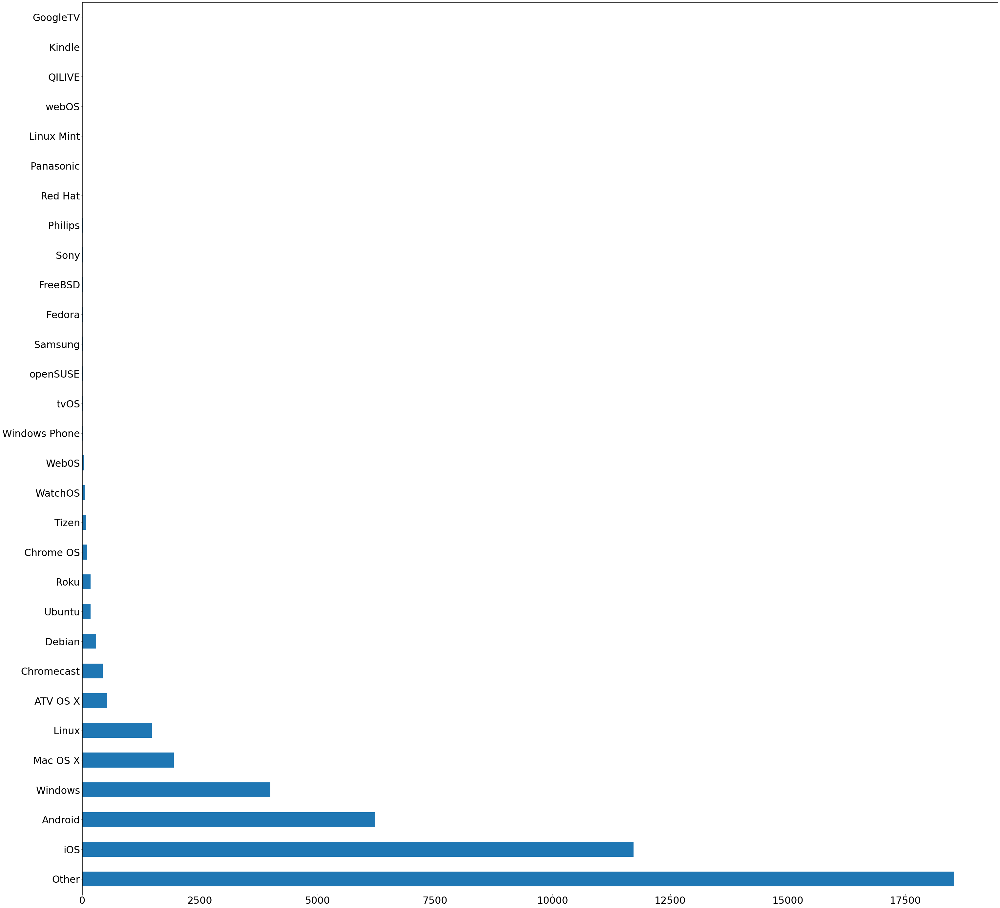

In [20]:
ax1=df['os_family'].value_counts().plot(kind='barh',figsize=(50,50))
ax1.tick_params(axis='both', labelsize=30)

In [21]:
fig, ax = plt.subplots(figsize=(250,500))
sns.histplot(data=df, x="os_family", y="fingerbank_name")
ax.tick_params(axis='both', labelsize=25)
plt.show()